https://www.kaggle.com/c/dog-breed-identification/data

In [ ]:
!unzip "drive/MyDrive/model-3/dog-breed-identification.zip" -d "drive/MyDrive/model-3/"

In [1]:
#import tensorflow
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('HUB version:', hub.__version__)

#Check for GPU
print("GPU:", 'available (+)' if tf.config.list_physical_devices("GPU") else "no")

TF version: 2.8.2
HUB version: 0.12.0
GPU: available (+)


In [2]:
#in case of any problems
try: 
  %tensorflow_version 2.x
except Exception:
  pass
print('TF version:', tf.__version__)

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.
TF version: 2.8.2


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import tensorflow

In [4]:
#getting our data ready and uploading foto-data into tensors
labels_csv = pd.read_csv('/content/drive/MyDrive/model-3/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
#each breed

labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

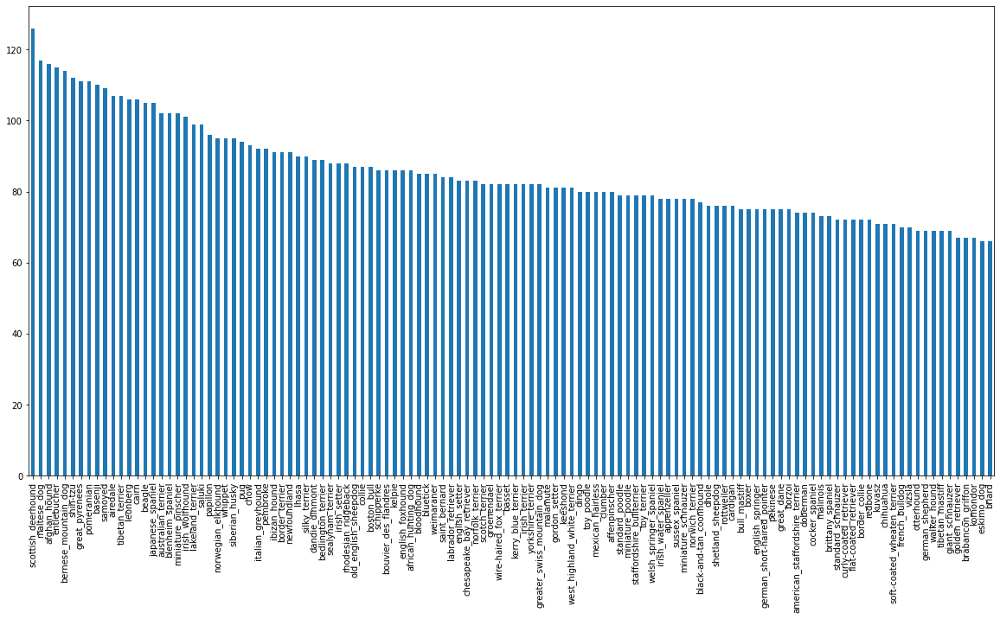

In [6]:
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [7]:
labels_csv["breed"].value_counts().mean(), labels_csv["breed"].value_counts().median()

(85.18333333333334, 82.0)

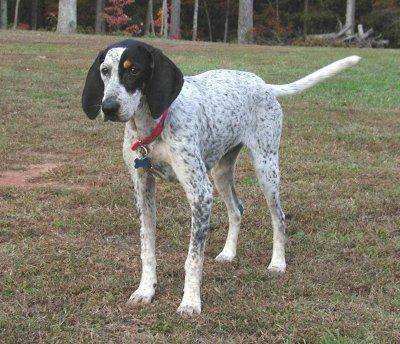

In [8]:
#viewing an image
from IPython.display import Image
Image("/content/drive/MyDrive/model-3/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

In [9]:
#create path-names frim ID's

filenames = ["/content/drive/MyDrive/model-3/train/" + fname + ".jpg"  for fname in labels_csv["id"]]

filenames

['/content/drive/MyDrive/model-3/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/model-3/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/model-3/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/model-3/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/model-3/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/model-3/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/model-3/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/model-3/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/model-3/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/model-3/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 '/content/drive/MyDrive/model-3/train/004396df1acd0f1247b740ca2b14616e.jpg',
 '/content/drive/MyDrive/model-3/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 '/content/drive/MyDrive/model-3/train/00693b8bc2470375cc744a639

In [10]:
#checking whether number of filenames matches number of actual image files

import os

if len(os.listdir("/content/drive/MyDrive/model-3/train/")) == len(filenames):
  print("everything ok")
else:
  print(":(")

everything ok


In [11]:
labels = labels_csv["breed"].to_numpy() 
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)


10222

In [13]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("everything ok")
else:
  print(":(")

everything ok


In [14]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [15]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
# Setup X & y variables
X = filenames
y = boolean_labels



In [22]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [23]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [24]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [25]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [26]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [27]:
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [28]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [29]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [30]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [31]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [32]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [33]:
#Displaying images

def show_25_img(images, labels):
  """
  Displays a plot of 25 images and their labels.
  """

  plt.figure(figsize=(10,10))
  # 5 rows 5 columns
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    #Display image
    plt.imshow(images[i])
    #Add label
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [34]:
#y[20].argmax()
unique_breeds[y[20].argmax()]

'doberman'

In [35]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [36]:
train_images, train_labels = next(train_data.as_numpy_iterator()) #taking next batch
len(train_images), len(train_labels)

(32, 32)

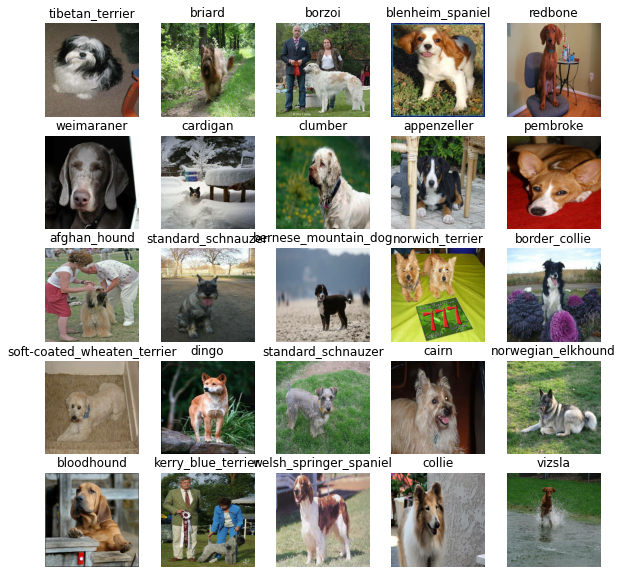

In [37]:
show_25_img(train_images,train_labels)

In [38]:
#Building a model

#Input shape -> Output shape -> URL of model we want to use

# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [39]:
IMG_SIZE

224

In [40]:
#Using Keras
#for binary classification use Activation:Sigmoid and Loss:BinaryCrossentropy
def create_model(input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE,model_url=MODEL_URL):
  #Setup model layers
  model = tf.keras.Sequential([
                              hub.KerasLayer(MODEL_URL), #Input layers
                              tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                    activation="softmax") #Output layer 
                               ])
  #Compile model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  #Building a model
  model.build(INPUT_SHAPE)

  return model

In [41]:
model = create_model()

In [42]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [43]:
#Creating callbacks

#helper func -> model use it to save progress, check progree or stop if dont improving

#1. for Tensorboard - for tracking progress
#2. for stopping - to prevent too long training

%load_ext tensorboard

#1. Load TensorBoard
#2. Create callback which save logs into a directory and our fit()

In [44]:
#Create a function for callback

import datetime 

def create_tensorboard_callback():
  #logs directory 
  logdir = os.path.join("/content/drive/MyDrive/model-3/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [45]:
#Early stopping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)

In [46]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10,max:100,step:10}



In [47]:
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!!)


In [48]:
#Creating function which trains a model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [49]:
model= train_model()

Epoch 1/100
25/25 [==============================] - 123s 4s/step - loss: 4.5536 - accuracy: 0.0925 - val_loss: 3.4331 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 155ms/step - loss: 1.6153 - accuracy: 0.7050 - val_loss: 2.2259 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 4s 152ms/step - loss: 0.5576 - accuracy: 0.9337 - val_loss: 1.7524 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 153ms/step - loss: 0.2543 - accuracy: 0.9862 - val_loss: 1.5635 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 5s 195ms/step - loss: 0.1479 - accuracy: 0.9962 - val_loss: 1.4954 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1015 - accuracy: 1.0000 - val_loss: 1.4532 - val_accuracy: 0.6050
Epoch 7/100
25/25 [==============================] - 5s 213ms/step - loss: 0.0760 - accuracy: 1.0000 - val_loss: 1.4084 - val_accuracy: 0.6350


In [50]:
#Our model is overfitting

#Checking TensorBoard

%tensorboard --logdir /content/drive/MyDrive/model-3/logs

<IPython.core.display.Javascript object>

In [51]:
#Making and evaluating predictions

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 105ms/step


array([[3.5941631e-03, 3.3493328e-05, 2.1573855e-03, ..., 2.3304918e-04,
        1.8889903e-05, 2.9806320e-03],
       [1.7441121e-03, 7.0534041e-04, 3.5649195e-02, ..., 5.9286261e-04,
        3.4252736e-03, 9.0752015e-05],
       [3.0390606e-07, 4.0077215e-05, 6.6878279e-06, ..., 5.4492507e-06,
        1.5187626e-06, 5.6928679e-05],
       ...,
       [5.8185306e-06, 3.9511822e-05, 2.5774885e-05, ..., 9.1795882e-06,
        1.6634543e-04, 7.0739836e-05],
       [6.2590535e-03, 2.9687435e-04, 1.4899379e-04, ..., 2.0406452e-04,
        6.6342203e-05, 9.1008162e-03],
       [1.1136556e-03, 6.5543986e-06, 1.5571123e-04, ..., 2.0813665e-03,
        9.4662490e-04, 2.7274029e-04]], dtype=float32)

In [52]:
predictions.shape

(200, 120)

In [53]:
np.sum(predictions[0]),np.sum(predictions[1])

(1.0, 1.0)

In [54]:
print(np.sum(predictions[0]))
print(f"Max value is: {np.max(predictions[0])}")
print(f"Max index is: {np.argmax(predictions[0])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}")

1.0
Max value is: 0.3011743426322937
Max index is: 70
Predicted label: lhasa


In [55]:
#Turn prediction probabilities into their respective label

def get_pred_label(prediction_probabilities):
  """
  Turn array of probabbilities into a breed
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

In [56]:
pred_label = get_pred_label(predictions[20])
pred_label

'flat-coated_retriever'

In [57]:
#Func for unbatching _data and comparing predictions to true labels

def unbatching(data):
  """
  Function for unbatching _data and comparing predictions to true labels
  """
  images_ = []
  labels_ = []

  for image, label in val_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_


#images_[0],labels_[0]   
#get_pred_label(labels_[0]), get_pred_label(predictions[0])                                
val_img,val_lab = unbatching(val_data)
val_img[0],val_lab[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [58]:
get_pred_label(val_lab[0]), get_pred_label(predictions[0])

('affenpinscher', 'lhasa')

In [61]:
#Visualizing our predictions

#Take array of preds, array of labels, array of images and integers -> convert preds into categories -> plot predicted probability

def plot_pred(prediction_probability, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  
  pred_prob, true_label, image = prediction_probability[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Chanhe the color depending if right or not
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label), 
            color=color)

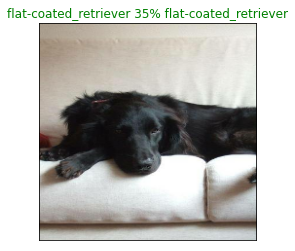

In [66]:
plot_pred(predictions,
          val_lab,
          val_img,
          n=20)

In [86]:
#New func to plot top 10 predictions

def top_ten_plot(prediction_probability, labels, n=1):
  """
  Plot top 10 highest predictions
  """
  
  pred_prob, true_label = prediction_probability[n], labels[n]

  #Get pred label
  pred_label = get_pred_label(pred_prob)
  #try this with predictons[0] to understand
  top_10_pred_indx = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indx]

  top_10_pred_labels = unique_breeds[top_10_pred_indx]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')
  
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

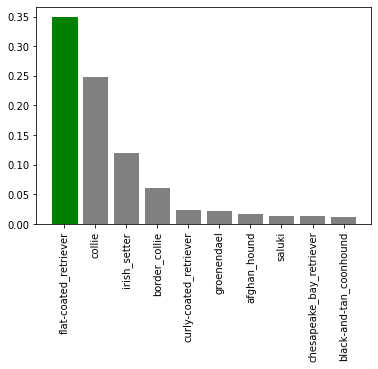

In [87]:
top_ten_plot(predictions, val_lab, n=20)

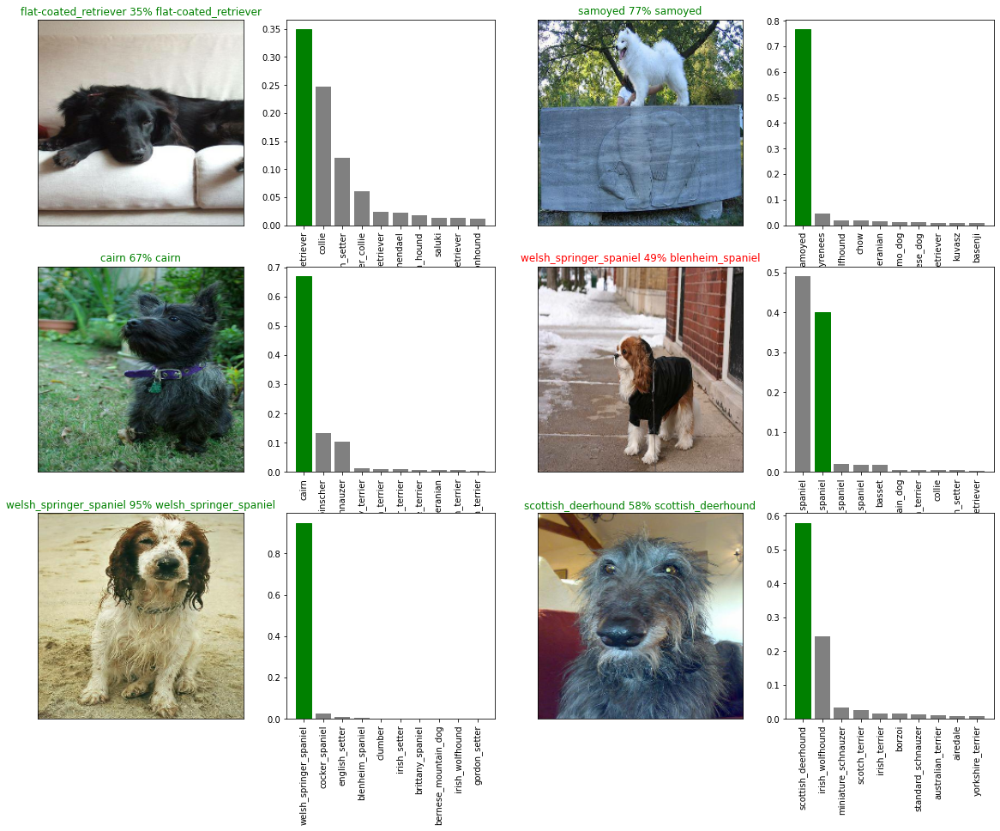

In [92]:
#Now combine foto and top 10 pred prob

i_m=20 #choose the start of foto plotting
num_rows = 3
num_col = 2
num_img = num_col*num_rows

plt.figure(figsize=(10*num_col,5*num_rows))

for i in range(num_img):
  plt.subplot(num_rows, num_col*2,2*i+1)
  plot_pred(predictions,
            val_lab,
            val_img,
            n=i+i_m)
  plt.subplot(num_rows, num_col*2,2*i+2)
  top_ten_plot(predictions, 
               val_lab, 
               n=i+i_m)
plt.show()

In [101]:
#Saving and loading trained model

def save_model(model, suffix=None):
  """
  Saves a given model in models directory witj suffix
  """

  modeldir = os.path.join("/content/drive/MyDrive/model-3/models",
                        datetime.datetime.now().strftime("%Y\%m\%d-%H:%M:%S"))
  model_path = modeldir + "-" + suffix + ".h5" #saving format of model

  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [99]:
#Loading saved model
def load_model(model_path):
  """
  Loads a model from file
  """

  print(f"Loading model from {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

In [102]:
#Now testing

save_model(model, suffix="1000-img-mobilenetV2-Adam")

Saving model to /content/drive/MyDrive/model-3/models/2022\08\30-10:29:16-1000-img-mobilenetV2-Adam.h5...


'/content/drive/MyDrive/model-3/models/2022\\08\\30-10:29:16-1000-img-mobilenetV2-Adam.h5'

In [103]:
loaded_1000_img = load_model("/content/drive/MyDrive/model-3/models/2022\\08\\30-10:29:16-1000-img-mobilenetV2-Adam.h5")

Loading model from /content/drive/MyDrive/model-3/models/2022\08\30-10:29:16-1000-img-mobilenetV2-Adam.h5...


In [104]:
loaded_1000_img.evaluate(val_data)

7/7 [==============================] - 2s 153ms/step - loss: 1.3172 - accuracy: 0.6550


[1.3172249794006348, 0.6549999713897705]

##Full dataset model

In [105]:
len(X),len(y)

(10222, 10222)

In [106]:
full_data = create_data_batches(X, y)


Creating training data batches...


In [107]:
full_data


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [108]:
full_model = create_model()

In [109]:
#Creating new callbacks

full_model_tensorboard = create_tensorboard_callback()
#No valid set when training on full data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=5)

##My Stop

In [ ]:
#Fit model - about 30 minutes so be patient :)
full_model.fet(x=full_data,
               epochs = NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
loaded_full_model = load_model("")

##Making predictions 

In [111]:
test_path = "/content/drive/MyDrive/model-3/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [112]:
test_filenames[:5]

['/content/drive/MyDrive/model-3/teste55fa0c818f485f8e36edfb464c4f129.jpg',
 '/content/drive/MyDrive/model-3/testdccc6c6c2f8cb55631b6ce664bf21fee.jpg',
 '/content/drive/MyDrive/model-3/teste37d651b9b5fdcf26ab37259fac877d1.jpg',
 '/content/drive/MyDrive/model-3/teste6d6ff5b33e6174158d5ab05a7eda95c.jpg',
 '/content/drive/MyDrive/model-3/teste062ea256ada165dfe998fbc6529dff7.jpg']

In [113]:
len(test_filenames)

10357

In [114]:
#Create test data batch

test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [115]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Making predictions

test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [ ]:
#Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predctions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

In [ ]:
test_predictions.shape

##Preparing data for Kaggle

In [126]:
#We need DF fith ID and breeds as columns

kaggle_df= pd.DataFrame(columns=['id']+list(unique_breeds))
kaggle_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [127]:
test_id = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
kaggle_df["id"] = test_id

In [128]:
kaggle_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e55fa0c818f485f8e36edfb464c4f129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dccc6c6c2f8cb55631b6ce664bf21fee,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e37d651b9b5fdcf26ab37259fac877d1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6d6ff5b33e6174158d5ab05a7eda95c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e062ea256ada165dfe998fbc6529dff7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
kaggle_df[list(unique_breeds)] = test_predictions
kaggle_df.head()

In [ ]:
kaggle_df.to_csv("/content/drive/MyDrive/model-3/full_model_predictions_for_kaggle.csv", 
                 index=False)

##Making predictions on our own images

In [129]:
my_path = "/content/drive/MyDrive/model-3/my-dogs/"
custom_my_path = [my_path + fname for fname in os.listdir(my_path)]

In [130]:
custom_my_path

[]

In [132]:
#Turn data into batch and predicting

my_data = create_data_batches(custom_my_path,test_data=True)
my_preds = loaded_full_model.predict(my_data)

In [ ]:
my_preds.shape

In [ ]:
#Get our labels from preds
my_pred_labels = [get_pred_label(my_preds[i]) for i in range(len(my_preds))]
my_pred_labels

In [ ]:
#Getting our images and labels
custom_images=[]
for image in my_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom image predictions - our func don't work without labels
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(my_pred_labels[i])
  plt.imshow(image)